In [6]:
import sys
sys.path.insert(0, '/home/workspace/mm_analysis')
sys.path.insert(0, '/home/workspace/')

from py_util import *
from utilities import *

hdir = '/home/workspace/'
wdir = hdir + "/mm_analysis/EXP-01244"
pltdir = wdir + "/plots/"
srldir = wdir + "/objects/"
# 
# raw_adata = sc.read_h5ad(srldir + 'raw_adata.h5ad')
# adata1 = sc.read_h5ad(srldir + 'subclustered_adata.h5ad')
adata2 = sc.read_h5ad(srldir + 'processed_adata_allcells.h5ad')
# adata3 = sc.read_h5ad(srldir + 'processed_adata_downsampled.h5ad')

In [7]:
adata2

AnnData object with n_obs × n_vars = 49435 × 18023
    obs: 'Doublet_Score', 'Predicted_Doublet', 'sample', 'base_sample', 'sample_type', 'name', 'names', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ig', 'log1p_total_counts_ig', 'pct_counts_ig', 'leiden_0_0', 'leiden_0_2', 'leiden_0_4', 'leiden_0_6', 'leiden_0_8', 'leiden_1_0', 'leiden_1_2', 'leiden_1_4', 'leiden_1_6', 'leiden_1_8', 'leiden_2_0'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ig', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'draw_graph', 'hvg', 'leiden_0_0', 'leiden_0_2', '

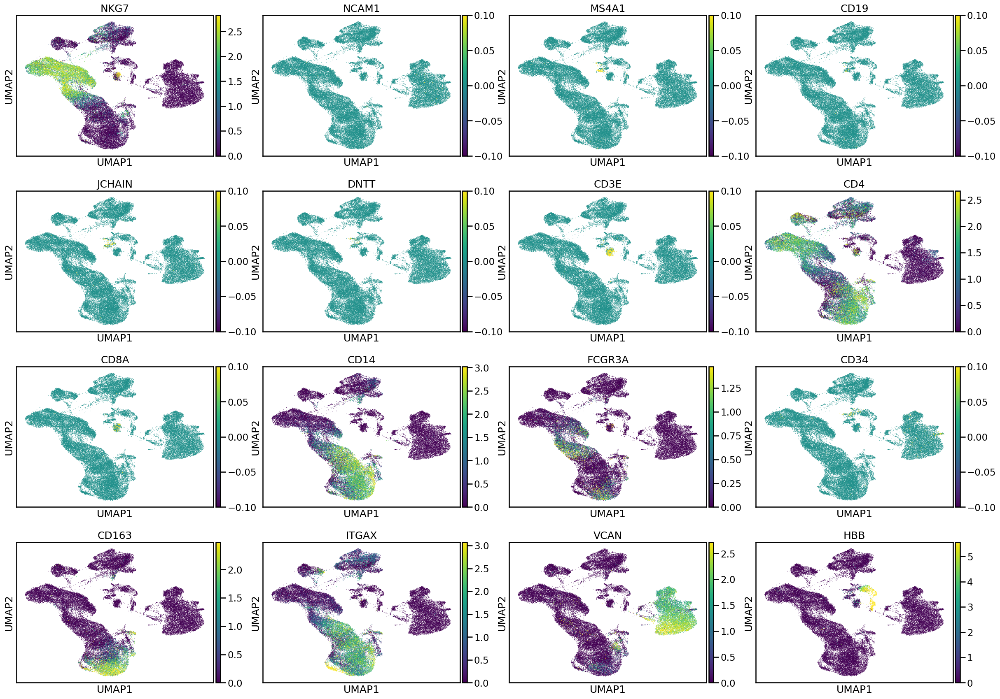

In [14]:
sc.pl.umap(
    adata2,
    color=['NKG7', 'NCAM1', 'MS4A1', 'CD19', 'JCHAIN', 'DNTT', 'CD3E', 'CD4', 'CD8A', 'CD14', 'FCGR3A', 'CD34',  'CD163', 'ITGAX', 'VCAN', 'HBB'],
    size=3,
    vmax='p99'
)

# Processing batched adata without downsampling

In [5]:
def process_adata(adata):
    
    # Filtering out mitochondrial and Ig genes
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    adata.var["ig"] = adata.var_names.str.contains("^IG")
    
    adata = adata[:, (adata.var['mt'] == False) & (adata.var['ig'] == False)]

    # Applying scanpy processing pipeline
    sc.pp.calculate_qc_metrics(
        adata, 
        qc_vars=["mt", "ig"],
        inplace=True,
        log1p=True
    )

    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(
        adata, 
        n_top_genes=2000, 
        batch_key="sample"
    )
    sc.tl.pca(adata)

    X = adata.obsm['X_pca'].astype(np.float64)

    harmony_out = hm.run_harmony(X, adata.obs, 'sample_type')

    adata.obsm['X_pca'] = harmony_out.Z_corr.T

    sc.pp.neighbors(adata)
    sc.tl.draw_graph(adata)
    sc.tl.umap(adata)

    res_range = np.round(np.arange(0, 2.2, 0.2), 1)
    
    for res in res_range:
        sc.tl.leiden(
            adata, 
            flavor="igraph",
            key_added=f"leiden_{str(res).replace('.', '_')}",
            n_iterations=2,
            resolution=res
        )
    
    # sc.tl.paga(adata, groups='leiden')
    # sc.tl.rank_genes_groups(
    #     adata, 
    #     groupby="leiden", 
    #     method="wilcoxon" # T-test
    # )

    # sc.tl.diffmap(adata)

    return adata


adata = process_adata(raw_adata).copy()

adata.write(srldir + 'processed_adata_allcells.h5ad', compression='gzip')

2025-01-24 18:31:54,219 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-01-24 18:31:58,971 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-01-24 18:31:59,195 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-01-24 18:32:10,684 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-01-24 18:32:21,767 - harmonypy - INFO - Converged after 2 iterations
Converged after 2 iterations
/home/workspace/environment/tissdiss_py_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Downsampling to the lowest count (Week 3 n=1092)

In [5]:
def process_adata(adata):

    samples = adata.obs['sample_type'].values.unique().tolist()
    
    ds_adata = {}
    
    for sample in samples:
        mask = adata.obs['sample_type'] == sample
        downsampled = sc.pp.subsample(
            adata[mask].copy(),
            n_obs = sum(adata.obs['sample_type'] == 'week3'),
            random_state = 0,
            copy = True
        )
    
        ds_adata[sample] = downsampled
    
    adata = ad.concat(ds_adata, label = "sample_type", join = 'outer', merge = 'same')
    
    # Filtering out mitochondrial and Ig genes
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    adata.var["ig"] = adata.var_names.str.contains("^IG")
    
    adata = adata[:, (adata.var['mt'] == False) & (adata.var['ig'] == False)]

    # Applying scanpy processing pipeline
    sc.pp.calculate_qc_metrics(
        adata, 
        qc_vars=["mt", "ig"],
        inplace=True,
        log1p=True
    )

    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(
        adata, 
        n_top_genes=2000, 
        batch_key="sample"
    )
    sc.tl.pca(adata)

    X = adata.obsm['X_pca'].astype(np.float64)

    harmony_out = hm.run_harmony(X, adata.obs, 'sample_type')

    adata.obsm['X_pca'] = harmony_out.Z_corr.T

    sc.pp.neighbors(adata)
    sc.tl.draw_graph(adata)
    sc.tl.umap(adata)

    res_range = np.round(np.arange(0, 2.2, 0.2), 1)
    
    for res in res_range:
        sc.tl.leiden(
            adata, 
            flavor="igraph",
            key_added=f"leiden_{str(res).replace('.', '_')}",
            n_iterations=2,
            resolution=res
        )
    
    # sc.tl.paga(adata, groups='leiden')
    # sc.tl.rank_genes_groups(
    #     adata, 
    #     groupby="leiden", 
    #     method="wilcoxon"
    # )

    # sc.tl.diffmap(adata)

    return adata


adata = process_adata(raw_adata).copy()

adata.write(srldir + 'processed_adata_lowestcells.h5ad', compression='gzip')

2025-01-28 22:39:23,797 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-01-28 22:39:24,698 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-01-28 22:39:24,762 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-01-28 22:39:25,863 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-01-28 22:39:26,863 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-01-28 22:39:27,896 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2025-01-28 22:39:28,932 - harmonypy - INFO - Iteration 5 of 10
Iteration 5 of 10
2025-01-28 22:39:30,052 - harmonypy - INFO - Converged after 5 iterations
Converged after 5 iterations
/home/workspace/environment/mm_py_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

# Batched adata w/o downsampling UMAPs

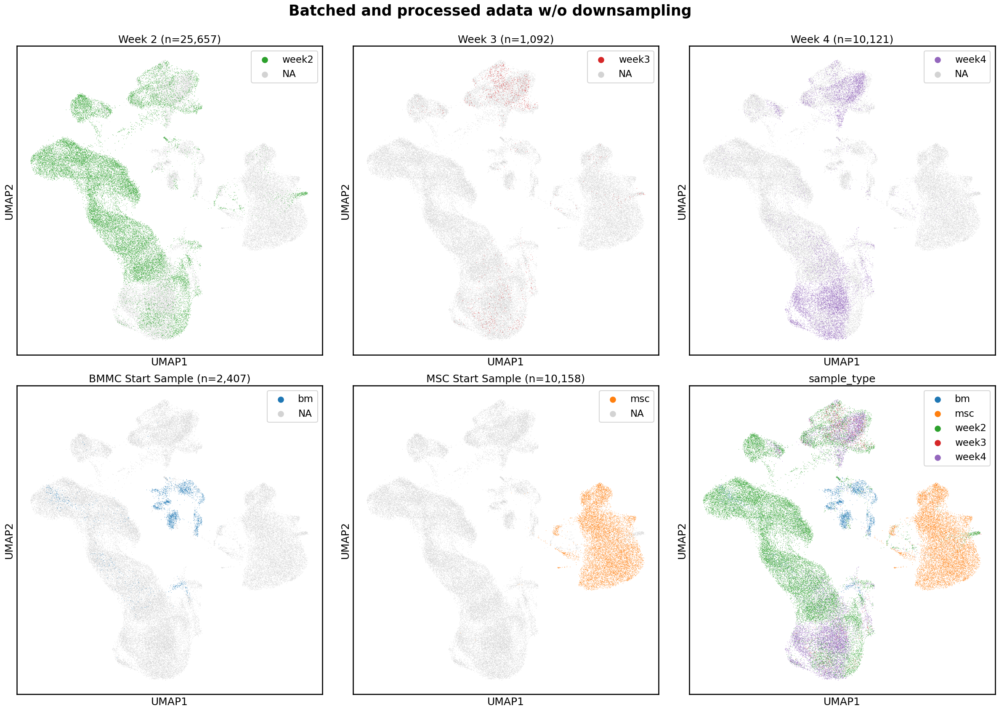

In [13]:
types = ['week2', 'week3', 'week4', 'bm', 'msc']

fig, ax, indices = subplot_grids(len(types) + 1, subplot_size=10, gridspec_kw={'wspace': 0.1, 'hspace': 0.1})

for i, sample_type in zip(indices, types):
    cell_num = len(adata[adata.obs['sample_type'] == sample_type])
    label = adata[adata.obs['sample_type'] == sample_type].obs['names'].unique()[0]
    sc.pl.umap(
        adata,
        color='sample_type',
        groups=sample_type,
        title=f'{label} (n={cell_num:,})',
        show=False,
        ax=ax[i],
        legend_loc='best'
    )

sc.pl.umap(adata, color='sample_type', show=False, ax=ax[1,2], legend_loc='best')

fig.suptitle('Batched and processed adata w/o downsampling', fontsize=25, y=0.93, weight='bold')

fig.savefig(pltdir + f'sample_UMAPs_allcells/batched_sample_UMAPs_allcells_overlayed.pdf', bbox_inches='tight', dpi=300)

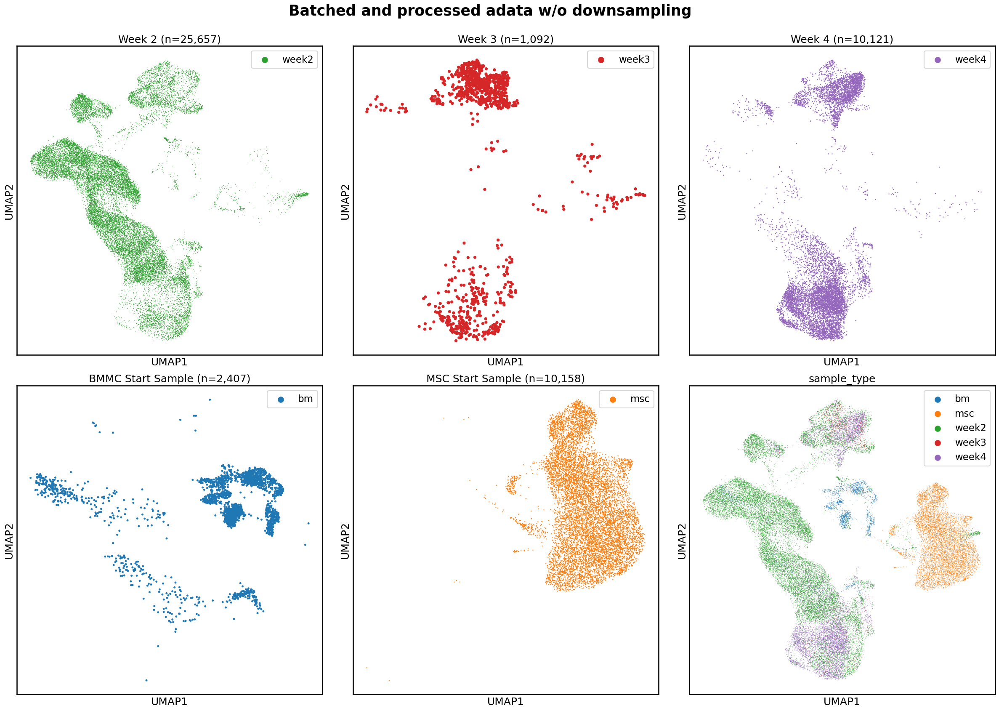

In [14]:
types = ['week2', 'week3', 'week4', 'bm', 'msc']

fig, ax, indices = subplot_grids(len(types) + 1, subplot_size=10, gridspec_kw={'wspace': 0.1, 'hspace': 0.1})

for i, sample_type in zip(indices, types):
    mask = adata.obs['sample_type'] == sample_type
    cell_num = len(adata[adata.obs['sample_type'] == sample_type])
    label = adata[adata.obs['sample_type'] == sample_type].obs['names'].unique()[0]
    sc.pl.umap(
        adata[mask],
        color='sample_type',
        title=f'{label} (n={cell_num:,})',
        show=False,
        ax=ax[i],
        legend_loc='best'
    )

sc.pl.umap(adata, color='sample_type', show=False, ax=ax[1,2], legend_loc='best')

fig.suptitle('Batched and processed adata w/o downsampling', fontsize=25, y=0.93, weight='bold')

fig.savefig(pltdir + f'sample_UMAPs_allcells/batched_sample_UMAPs_allcells_individual.pdf', bbox_inches='tight', dpi=300)

Text(0.5, 0.93, 'Batched and processed adata w/o downsampling leiden 0.8')

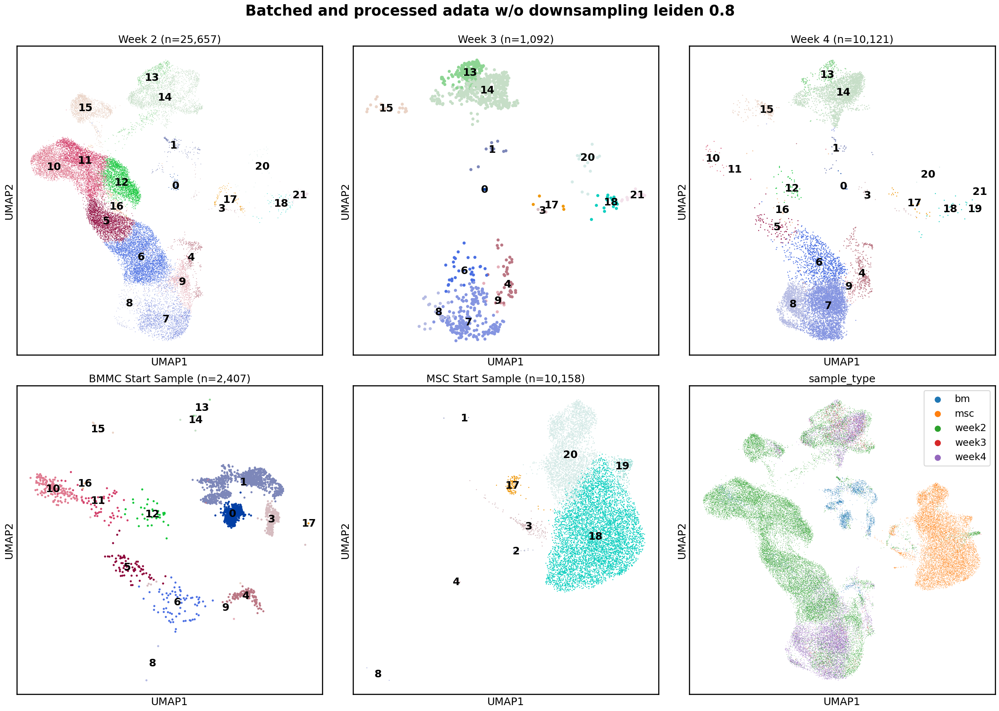

In [20]:
types = ['week2', 'week3', 'week4', 'bm', 'msc']

fig, ax, indices = subplot_grids(len(types) + 1, subplot_size=10, gridspec_kw={'wspace': 0.1, 'hspace': 0.1})

for i, sample_type in zip(indices, types):
    mask = adata.obs['sample_type'] == sample_type
    cell_num = len(adata[adata.obs['sample_type'] == sample_type])
    label = adata[adata.obs['sample_type'] == sample_type].obs['names'].unique()[0]
    sc.pl.umap(
        adata[mask],
        color='leiden_0_8',
        title=f'{label} (n={cell_num:,})',
        show=False,
        ax=ax[i],
        legend_loc='on data'
    )

sc.pl.umap(adata, color='sample_type', show=False, ax=ax[1,2], legend_loc='best')

fig.suptitle('Batched and processed adata w/o downsampling leiden 0.8', fontsize=25, y=0.93, weight='bold')

# fig.savefig(pltdir + f'sample_UMAPs_allcells/batched_sample_UMAPs_allcells_individual.pdf', bbox_inches='tight', dpi=300)

# Batched adata w/ downsampling UMAPs

Text(0.5, 0.93, 'Batched and processed adata w/ downsampling leiden 1.1')

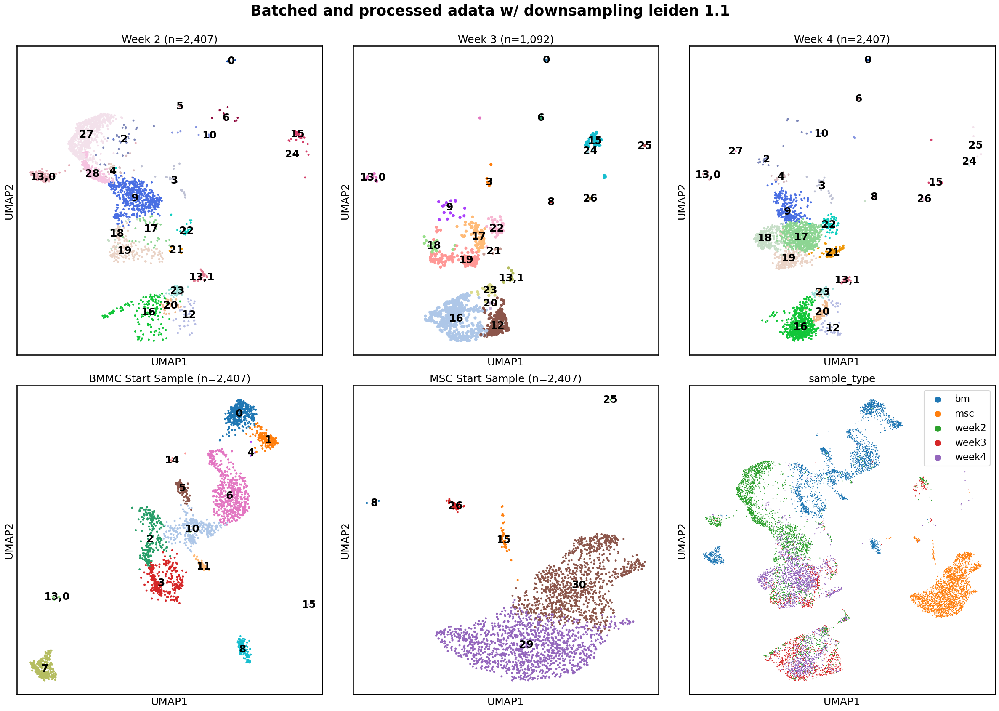

In [26]:
types = ['week2', 'week3', 'week4', 'bm', 'msc']

fig, ax, indices = subplot_grids(len(types) + 1, subplot_size=10, gridspec_kw={'wspace': 0.1, 'hspace': 0.1})

for i, sample_type in zip(indices, types):
    mask = adata1.obs['sample_type'] == sample_type
    cell_num = len(adata1[adata1.obs['sample_type'] == sample_type])
    label = adata1[adata1.obs['sample_type'] == sample_type].obs['names'].unique()[0]
    sc.pl.umap(
        adata1[mask],
        color='sub_leiden',
        title=f'{label} (n={cell_num:,})',
        show=False,
        ax=ax[i],
        legend_loc='on data'
    )

sc.pl.umap(adata1, color='sample_type', show=False, ax=ax[1,2], legend_loc='best')

fig.suptitle('Batched and processed adata w/ downsampling leiden 1.1', fontsize=25, y=0.93, weight='bold')

# fig.savefig(pltdir + f'sample_UMAPs_allcells/batched_sample_UMAPs_allcells_individual.pdf', bbox_inches='tight', dpi=300)

# Comparing batched/unbatched non-downsampled UMAPs